<a href="https://colab.research.google.com/github/BGR-EGHA/EGU23_GM3.3_ls_benchmark/blob/master/Benchmark_Dataset_230409.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Exploring the benchmark dataset for tasks related to landslide susceptibility assessment**



# Abstract

In the presented study, we investigate the possibilities of performing tasks related to landslide susceptibility assessment (LSA) on the provided benchmark dataset. The slope unit-based dataset consists of aggregated predisposing factors and two label sets. Although initially introduced as a dataset for binary classification tasks, it is also suitable for zoning and regression analysis in combination with the underlying landslide inventory. Zoning ranks slope units to delineate the study area in susceptibility zones. In the regression analysis, we try to predict a numeric target value (e.g.,  landslide count) by the slope unit's attributes.

We explored the benchmark dataset using bivariate and multivariate statistical visualization techniques to understand the data relations better. We found the dataset at this stage insufficient for achieving a well-explainable high-performance classification using linear models. Most attributes are not specific to linearly separate the given labels. The chosen central tendency statistics (mean and standard deviation) may not characterize the parameter distributions inside the slope unit sufficiently.

We propose a theoretical concept for zonation analysis to assess the best possible performance on the given discrete dataset using the success rate curve as the model evaluation metric. Because any applied algorithm cannot modify the geometry of the discrete slope units, the evaluation metric only depends on the relative ranking of slope units. The best performance is obtainable without computing a predictive model. For frequency-related models (weighting of factors with landslide count statistics), a simple direct computation of conditional probabilities or frequency ratio on the slope units as a ranking factor provides the best possible ranking. Combining the label and slope unit's area provides the best slope unit ranking for binary labels.

We conducted a regression and classification analysis with artificial neural networks (ANN) testing different combinations of parameters (sensitivity analysis) architectures allowing for modeling nonlinear relations. In both analyses, initial results show that a complex net architecture can boost the model fit on the training dataset by losing predictive performance on test data. Also, the dataset pre-exploration corresponds well with the sensitivity analysis with ANN. The number of parameters is reducible to few effective predictors without losing much accuracy in classification, which is poor-to-moderate depending on the utilized label set.

While slope units as an aggregation for geomorphological analyses remain undisputed, the proposed aggregation of predisposing factors in slope units at the analysis's entry point needs further discussion. Aggregating the results of a raster-based LSA to overcome deviances in landslide susceptibility patterns caused by data uncertainties or different methods could be more suitable at this point. Slope units should be analyzed with regression analysis in LSA to consider their different spatial extents during the calculation.

We provide our scripts, visualizations, and results as a Jupyter Notebook on our GitHub: https://github.com/BGR-EGHA/EGU23_GM3.3_ls_benchmark.


# Prepare Data and Notebook

In this part we set up data imports and functions used for the analysis.

Geopandas is not a standard package in GoogleColab and needs to be installed via pip install:

In [2]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 97.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 58.7 MB/s eta 0:00:00


Importing needed python packages:

In [3]:
import geopandas
import scipy
import pandas as pd
import seaborn as sns
import math
import matplotlib.pyplot as plt
import warnings
import numpy as np
import statistics
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.metrics import roc_auc_score
import tensorflow as tf

warnings.filterwarnings("ignore", module = "matplotlib\..*")
# Hide VisibleDeprecationWarning

Download and unzip the benchmark dataset:

In [4]:
!wget https://geomorphology.irpi.cnr.it/tools/slope-units/slope-units-map/dataset_benchmark.zip
!unzip dataset_benchmark.zip

--2023-04-09 20:04:13--  https://geomorphology.irpi.cnr.it/tools/slope-units/slope-units-map/dataset_benchmark.zip
Resolving geomorphology.irpi.cnr.it (geomorphology.irpi.cnr.it)... 194.119.218.58
Connecting to geomorphology.irpi.cnr.it (geomorphology.irpi.cnr.it)|194.119.218.58|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21577787 (21M) [application/zip]
Saving to: ‘dataset_benchmark.zip’

dataset_benchmark.z 100%[===================>]  20.58M   985KB/s    in 21s     

2023-04-09 20:04:36 (982 KB/s) - ‘dataset_benchmark.zip’ saved [21577787/21577787]

Archive:  dataset_benchmark.zip
   creating: dataset_benchmark/
  inflating: dataset_benchmark/README.txt  
  inflating: dataset_benchmark/README.txt~  
   creating: dataset_benchmark/su_benchmark/
  inflating: dataset_benchmark/su_benchmark.csv  
  inflating: dataset_benchmark/su_benchmark.gpkg  
  inflating: dataset_benchmark/su_benchmark/su_benchmark.dbf  
  inflating: dataset_benchmark/su_benchmark/su_ben

Download and unzip the base landslide dataset (point data):

In [5]:
!wget https://idrogeo.isprambiente.it/opendata/frane/frane_piff_umbria_opendata.zip
!unzip frane_piff_umbria_opendata.zip

--2023-04-09 20:04:36--  https://idrogeo.isprambiente.it/opendata/frane/frane_piff_umbria_opendata.zip
Resolving idrogeo.isprambiente.it (idrogeo.isprambiente.it)... 193.206.192.71
Connecting to idrogeo.isprambiente.it (idrogeo.isprambiente.it)|193.206.192.71|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1615318 (1.5M) [application/zip]
Saving to: ‘frane_piff_umbria_opendata.zip’

frane_piff_umbria_o 100%[===================>]   1.54M  2.04MB/s    in 0.8s    

2023-04-09 20:04:38 (2.04 MB/s) - ‘frane_piff_umbria_opendata.zip’ saved [1615318/1615318]

Archive:  frane_piff_umbria_opendata.zip
  inflating: frane_piff_opendataPoint.prj  
  inflating: frane_piff_opendataPoint.shp  
  inflating: wfsrequest.txt          
  inflating: frane_piff_opendataPoint.shx  
  inflating: frane_piff_opendataPoint.dbf  
  inflating: frane_piff_opendataPoint.cst  


Download the extended benchmark dataset:

In [6]:
#!wget OUR_GITHUB_URL_HERE 

Define functions for analysis:

*   get_point_biseral_correlation
*   plot_x_y_discrete
*   calc_auc






In [7]:
def plot_point_biserial_correlation(gdf, discrete, cont_list, style="violin"):
  rows = (len(cont_list) + 1) // 2
  fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(10, 3*rows))
  for i, cont in enumerate(cont_list):
    true_list = gdf[cont][gdf[discrete]==1].to_list()
    false_list = gdf[cont][gdf[discrete]==0].to_list()
    true_count = len(true_list)
    false_count = len(false_list)
    total_count = true_count + false_count
    true_mean = statistics.mean(true_list)
    false_mean = statistics.mean(false_list)
    total_list = [*true_list, *false_list]
    total_sd = statistics.stdev(total_list)
    pb = ((true_mean - false_mean) / total_sd) * math.sqrt((true_count*false_count)/total_count**2)
    print(f"r_pb of {discrete} and {cont: <{10}} = {pb}")
    row = i // 2
    col = i % 2
    if rows > 1:
      ax = axes[row, col]
    else:
      ax = axes[col]
    if style == "violin":
      ax.violinplot((true_list, false_list))
    elif style == "box":
      ax.boxplot((true_list, false_list))
    ax.set(title=f"$r_{{pb}}$ of {discrete} and {cont} = {round(pb, 4)}",
             ylabel=cont,
             xticks=[1, 2],
             xticklabels=(
              f"{discrete} = 1 \n Avg. {cont}: {round(true_mean, 4)}",
              f"{discrete} = 0 \n Avg. {cont}: {round(false_mean, 4)}"))
  fig.tight_layout()
  plt.show()

In [8]:
def plot_x_y_discrete(gdf, x, y, discrete):
  select1 = gdf[[discrete, x, y]][gdf[discrete]==1]
  select0 = gdf[[discrete, x, y]][gdf[discrete]==0]
  plt.xlabel(x)
  plt.ylabel(y)
  plt.scatter(select1[x], select1[y], s=1, label="SU with landslides")
  plt.scatter(select0[x], select0[y], s=1, label="SU without landslides")
  plt.legend()

In [9]:
def calc_auc(x, y):
  """
  Calculates area under curve
  """
  auc = 0
  for i in range(1, len(x)):
      auc+=(x[i]-x[i-1])*y[i] - ((x[i]-x[i-1])*(y[i]-y[i-1])/2)      
  return auc

In [10]:
def jensen_shannon_distance(df, column_name, label_name):
  label_1 = df[df[label_name]==1]
  label_0 = df[df[label_name]==0]
  data_1 = label_1[column_name].values
  data_0 = label_0[column_name].values
  kde_data_1 = scipy.stats.gaussian_kde(data_1)
  kde_data_0 = scipy.stats.gaussian_kde(data_0)
  pdf_1 = kde_data_1.evaluate(np.linspace(data_1.min(), data_1.max(), 100))
  pdf_0 = kde_data_0.evaluate(np.linspace(data_0.min(), data_0.max(), 100))
  js_div = scipy.spatial.distance.jensenshannon(pdf_0, pdf_1, base=2)
  return js_div

# Explore the dataset - Data visualization





### **Loading the su_benchmark.shp dataset as geopandas frame and checking the column names**


In [11]:
gdf = geopandas.read_file("dataset_benchmark/su_benchmark/su_benchmark.shp")
gdf.columns

Index(['id', 'slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd',
       'tcurv_aver', 'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver',
       'easns_stdd', 'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev',
       'BDRICM_ave', 'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave',
       'CLYPPT_std', 'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std',
       'Max_Distan', 'D_sqrt_A', 'presence1', 'presence2', 'area', 'geometry'],
      dtype='object')

##**Check the multicollinearity of the variables**

<Axes: >

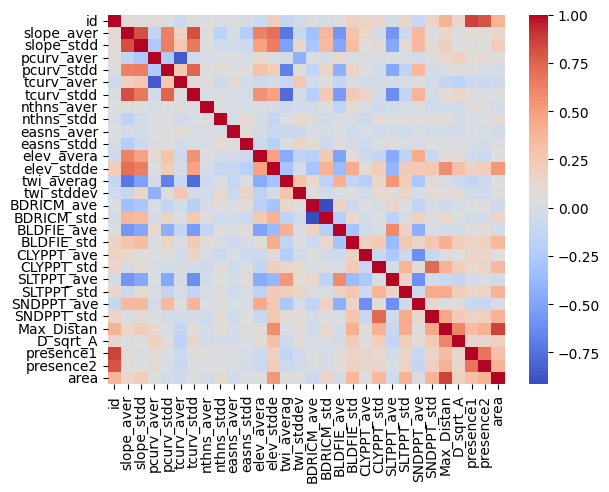

In [12]:
corr = gdf.corr()
sns.heatmap(corr, cmap="coolwarm",
        xticklabels=corr.columns,
        yticklabels=corr.columns)



##**SUs with label "presence1" = 1**


In [13]:
print("Total number SU:",gdf["presence1"].count())
print("Number of SU with landslides:", gdf["presence1"].value_counts()[1])
print("Number of SU without landslides", gdf["presence1"].value_counts()[0])

Total number SU: 7360
Number of SU with landslides: 3594
Number of SU without landslides 3766


Select some variables to perform pair-plot analysis.

*Modify the colum names to include other variables*.

In [14]:
selection_p1 = gdf[['presence1','slope_aver', 'elev_avera',
       'BDRICM_ave', 'BLDFIE_ave', 'CLYPPT_ave', 'SLTPPT_ave', 'SNDPPT_ave',
       'Max_Distan', 'D_sqrt_A', 'area']]

### **Calculate Jensen-Shannon Distance**
In probability theory and statistics, the Jensen–Shannon divergence is a method of measuring the similarity between two probability distributions ([Wikipedia](https://en.wikipedia.org/wiki/Jensen%E2%80%93Shannon_divergence)). A value of 0 indicates two identical distributions.

In [15]:
columns = selection_p1.columns
for column in columns:
  if column != 'presence1':
    js = jensen_shannon_distance(selection_p1, column, 'presence1')
    print(f"Jensen-Shannon distance of {column: <{10}} and presence1:", js)

Jensen-Shannon distance of slope_aver and presence1: 0.11130924718645721
Jensen-Shannon distance of elev_avera and presence1: 0.08766639463799965
Jensen-Shannon distance of BDRICM_ave and presence1: 0.17703266232110326
Jensen-Shannon distance of BLDFIE_ave and presence1: 0.07172630317652691
Jensen-Shannon distance of CLYPPT_ave and presence1: 0.06336800373358055
Jensen-Shannon distance of SLTPPT_ave and presence1: 0.11243174788833411
Jensen-Shannon distance of SNDPPT_ave and presence1: 0.14683978271028986
Jensen-Shannon distance of Max_Distan and presence1: 0.11201160175329977
Jensen-Shannon distance of D_sqrt_A   and presence1: 0.0309158290619881
Jensen-Shannon distance of area       and presence1: 0.21440518250977797


### **Point biseral correlation**
The point biserial correlation coefficient ($r_{pb}$) is a correlation coefficient used when one variable (e.g. Y) is dichotomous; Y can either be "naturally" dichotomous, like whether a coin lands heads or tails, or an artificially dichotomized variable. In most situations it is not advisable to dichotomize variables artificially. When a new variable is artificially dichotomized the new dichotomous variable may be conceptualized as having an underlying continuity. If this is the case, a biserial correlation would be the more appropriate calculation ([Wikipedia](https://en.wikipedia.org/wiki/Point-biserial_correlation_coefficient))

r_pb of presence1 and slope_aver = 0.08490276488808005
r_pb of presence1 and elev_avera = -0.06624892565524111
r_pb of presence1 and BDRICM_ave = 0.04014278104115276
r_pb of presence1 and BLDFIE_ave = 0.060949538044742776
r_pb of presence1 and CLYPPT_ave = 0.14934995687628871
r_pb of presence1 and SLTPPT_ave = -0.019634078786856086
r_pb of presence1 and SNDPPT_ave = -0.10567838500144235
r_pb of presence1 and Max_Distan = 0.3383099263795282
r_pb of presence1 and D_sqrt_A   = 0.13058041280641075
r_pb of presence1 and area       = 0.3135630642248536


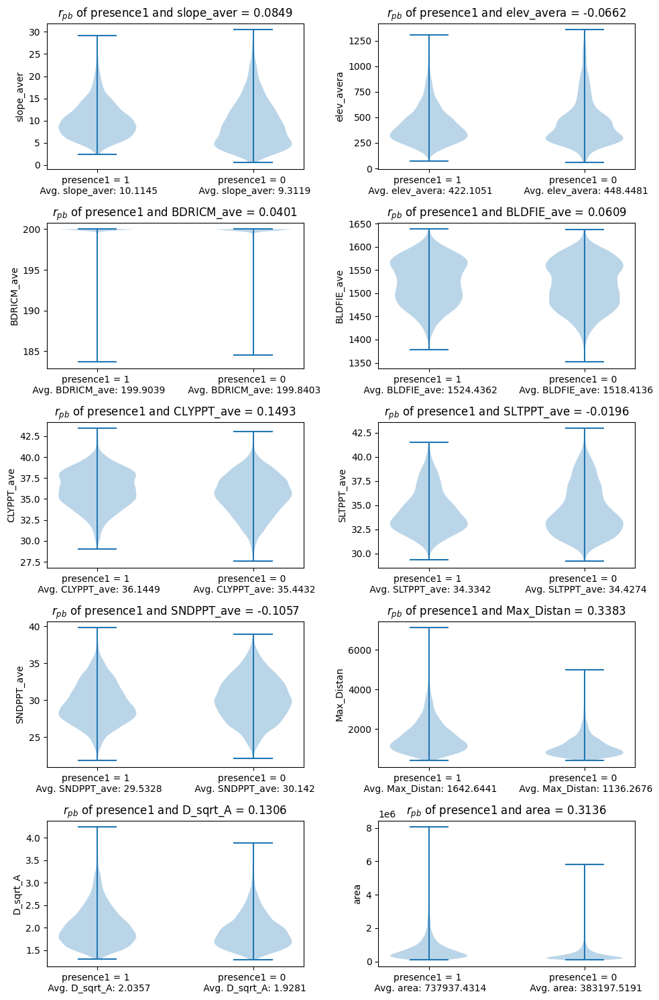

In [16]:
plot_point_biserial_correlation(gdf, "presence1", ['slope_aver', 'elev_avera',
       'BDRICM_ave', 'BLDFIE_ave', 'CLYPPT_ave', 'SLTPPT_ave', 'SNDPPT_ave',
       'Max_Distan', 'D_sqrt_A', 'area'])

### **Variables Pair-Plots**

Use the selected variables to plot joint distributions for presence and absence of landslides based on the label 'presence1'.
The main diagonal shows the marginal distributions of the variable for presence and absence of landslides indicating the separability of the labels based on this variable. The point plots show the pairwise relationship for a given variable pair for presence and absence of landslides.

**Comment:**
Generally it can be stated that there is no prominet separability among the two label groups based on the selected variables. All variables show large overlap. Jensen-Shannon Distance suggest that the area could have the largest impact in separating the labels. Also the pair plots do not show an well established separability based on variable pairs.

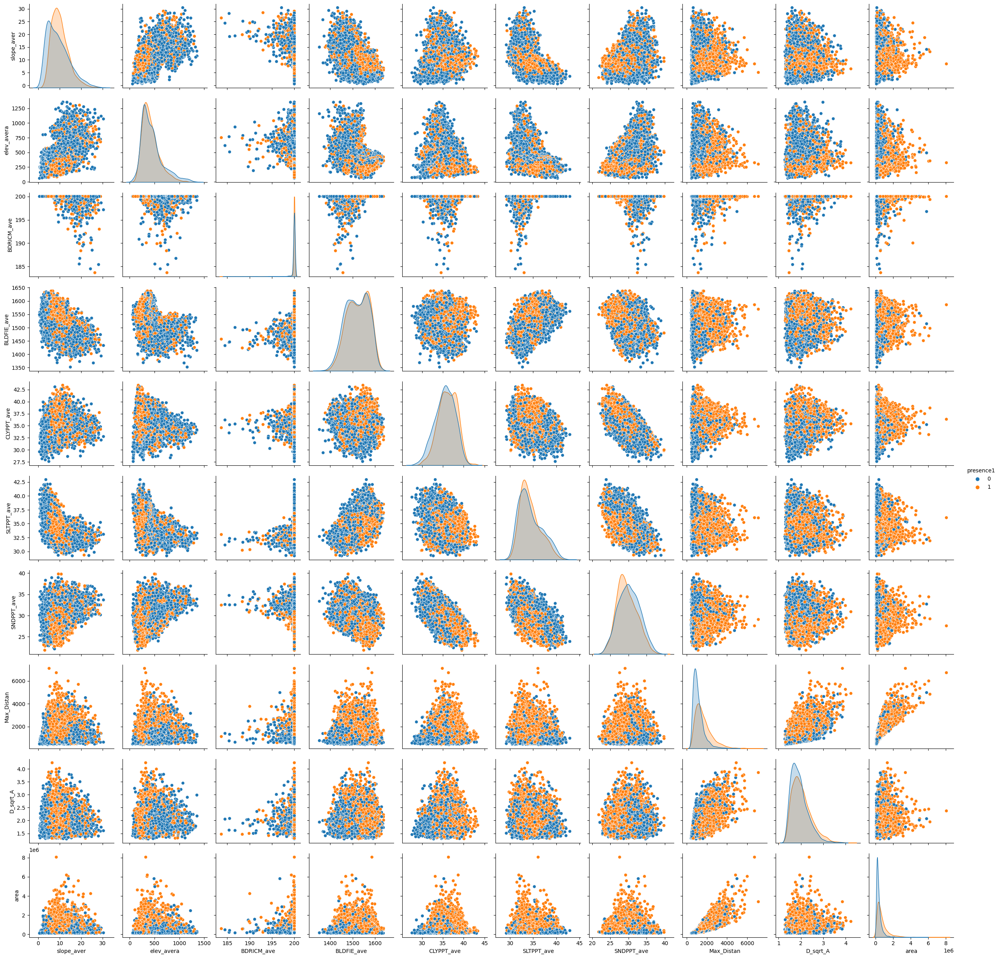

In [ ]:
sns.pairplot(selection_p1, hue='presence1', diag_kind='kde')

## **SUs with label "presence2" = 1**

In [17]:
print("Total number SU:",gdf["presence2"].count())
print("Number of SU with landslides:", gdf["presence2"].value_counts()[1])
print("Number of SU without landslides", gdf["presence2"].value_counts()[0])

Total number SU: 7360
Number of SU with landslides: 2271
Number of SU without landslides 5089


Select some variables to perform pair-plot analysis.

*Modify the colum names to include other variables*.

In [18]:
selection_p2 = gdf[['presence2','slope_aver', 'elev_avera',
       'BDRICM_ave', 'BLDFIE_ave', 'CLYPPT_ave', 'SLTPPT_ave', 'SNDPPT_ave',
       'Max_Distan', 'D_sqrt_A', 'area']]

###**Calculate Jensen-Shannon-Distance**

In [19]:
columns = selection_p2.columns
for column in columns:
  if column != 'presence2':
    js = jensen_shannon_distance(selection_p2, column, 'presence2')
    print(f"{column: <{10}}:", js)

slope_aver: 0.08506372115506833
elev_avera: 0.12990673101281763
BDRICM_ave: 0.09193961829149226
BLDFIE_ave: 0.14453443002920308
CLYPPT_ave: 0.06596906670679933
SLTPPT_ave: 0.15809896015366384
SNDPPT_ave: 0.18950782366046723
Max_Distan: 0.14569385420310427
D_sqrt_A  : 0.040323276721893814
area      : 0.2790181505961847


### **Point biseral correlation**

r_pb of presence2 and slope_aver = 0.07468507304671643
r_pb of presence2 and elev_avera = -0.07017624788910493
r_pb of presence2 and BDRICM_ave = 0.024046192195773485
r_pb of presence2 and BLDFIE_ave = 0.08382962122705981
r_pb of presence2 and CLYPPT_ave = 0.1354448504878679
r_pb of presence2 and SLTPPT_ave = 0.0023729140523921564
r_pb of presence2 and SNDPPT_ave = -0.11372128883872061
r_pb of presence2 and Max_Distan = 0.3985113416100748
r_pb of presence2 and D_sqrt_A   = 0.13998644947599423
r_pb of presence2 and area       = 0.3872818003499479


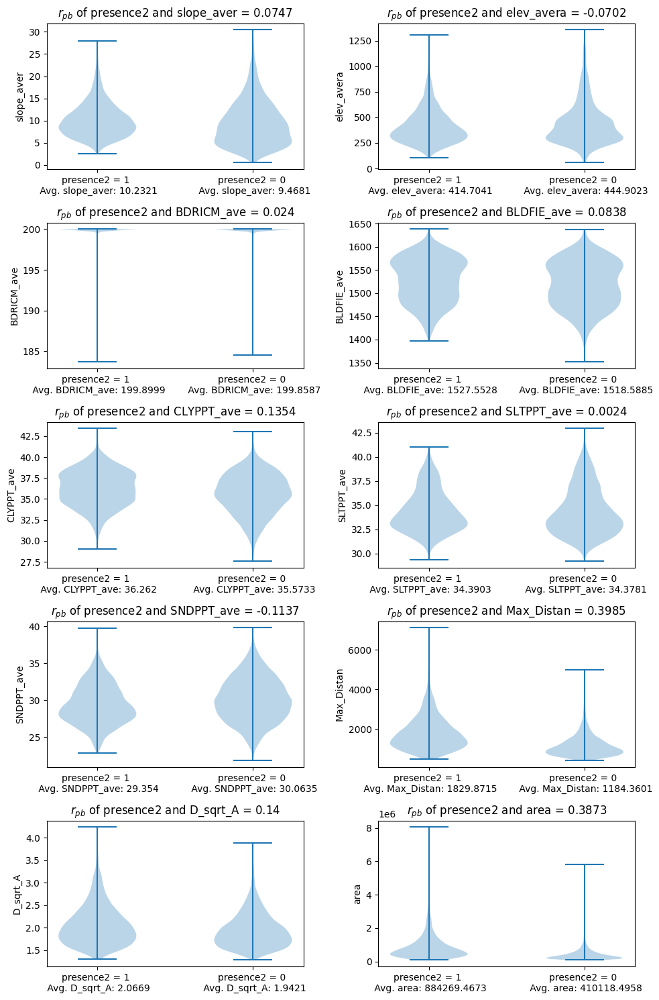

In [20]:
plot_point_biserial_correlation(gdf, "presence2", ['slope_aver', 'elev_avera',
       'BDRICM_ave', 'BLDFIE_ave', 'CLYPPT_ave', 'SLTPPT_ave', 'SNDPPT_ave',
       'Max_Distan', 'D_sqrt_A', 'area'])

### **Variables Pair-Plots**

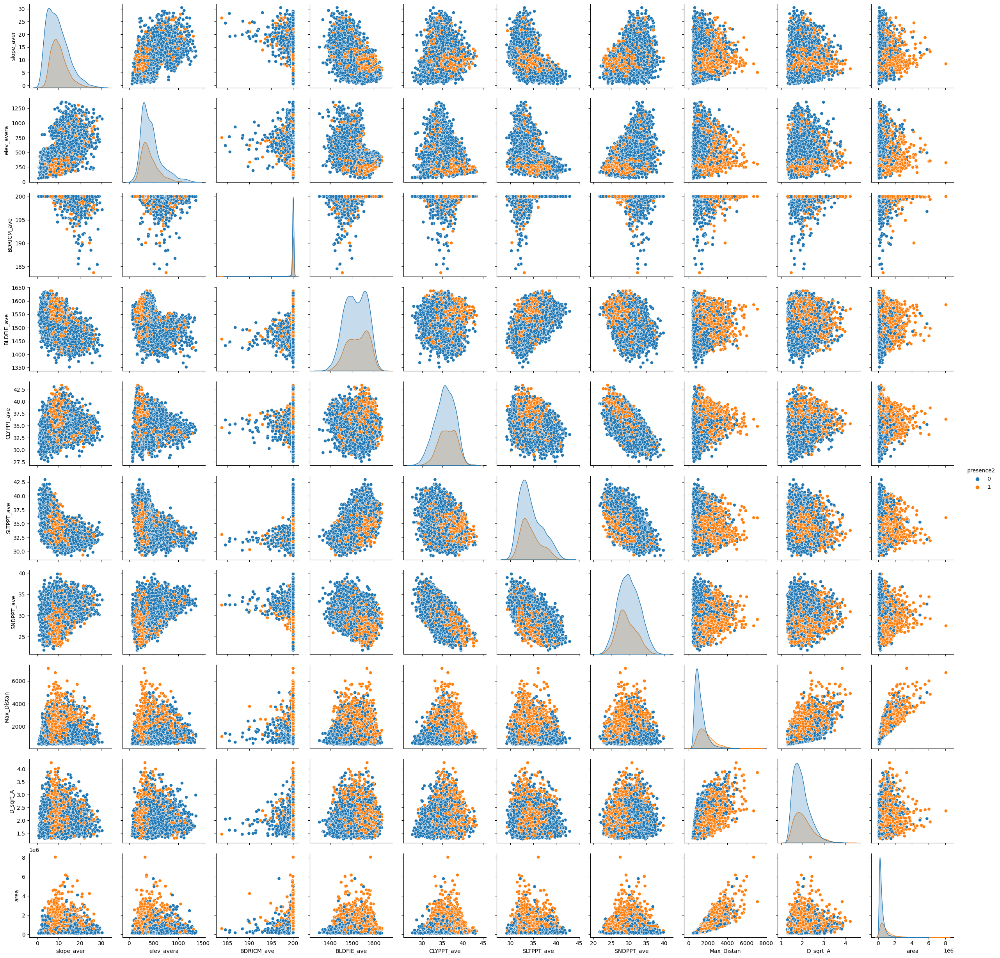

In [ ]:
sns.pairplot(selection_p2, hue='presence2', diag_kind='kde')

# **Best possible AUC value based on point frequency and SU area**

## Basic Idea
The validation with Receiver Operating Characteristics (ROC) Curve or related success rate on discrete spatial datasets is strongly governed by the size of unique conditions enabled by the model (for vector data the area can be understud as a standard metric to express countable elements of the probability space; in raster analysis raster cells act as the smallest countable element with associated probability value). This allows us to estimate the best possible model outcome given by the restricted geometry constellation of discrete units (in this case, Slope Units). Specifically, any applied model cannot change slope units in shape (no hyperplane can cross the boundaries of the slope units). Therefore, they provide a hard spatial constraint on the model performance, preserving the basic geometry pattern. The latter makes the model depend only on ranking the slope units along the x-axis of ROC or success rate.
This enables us to investigate the best possible ranking of slope units to maximize the AUC value in a simple descriptive way without considering the causal factors.

**Comment:**
From a theoretical perspective, excluding the area of the slope unit (SU) during the evaluation process could result in better AUC (area under the curve) values. However, this approach may not be appropriate if the analysis aims to establish a spatial zoning of landslide susceptibility. Furthermore, it is reasonable to assume that the size of the slope unit affects the probability of landslide occurrence, as larger units have a higher likelihood of experiencing at least one landslide at the same probability level than smaller units by chance. Therefore, ignoring the area of the SU could lead to biased results in the context of landslide susceptibility analysis, especially if the goal is to identify vulnerable areas for risk management and mitigation.



## **Experiment 1: Best possible AUC with landslide count (frequency ratio)**
We use original point data to estimate the event frequency in slope units. We use the frequency ratio in the slope unit area (corresponding to a conditional probability) to rank the slope units. Based on the ranking, we compute the success rate proposed by *Chung and Fabbri (2003)*.

☝ **General comment**: Applying Slope Units as fixed geometrical boundaries (unique classes) stands in contrast to the classical raster-based landslide susceptibility assessment. In the latter, the involvement of several parameters is aimed to increase the area's discrimination to smaller unique condition areas and narrow the landslide-prone areas. With slope units as fixed discrete units (classes), the only possibility to improve the model is to rearrange the slope unit's relative ranking.

In [21]:
gdf_su = geopandas.read_file("dataset_benchmark/su_benchmark/su_benchmark.shp")

In [22]:
gdf_points = geopandas.read_file("frane_piff_opendataPoint.shp")

First we perform spatial join using geopandas and create a pivot table:

In [23]:
sjoin = geopandas.sjoin(gdf_su, gdf_points) #Spatial join Points to polygons
pivot = pd.pivot_table(sjoin,index='id',columns='nome_tipo',aggfunc={'nome_tipo':len})
pivot.columns = pivot.columns.droplevel()
pivot

nome_tipo,Aree con crolli/ribaltamenti diffusi,Aree con frane superficiali diffuse,Aree con sprofondamenti diffusi,Colamento lento,Colamento rapido,Complesso,Crollo/Ribaltamento,Scivolamento rotazionale/traslativo,Sprofondamento,n.d.
id,,,,,,,,,,
8,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
27,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,2.0
32,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
7727,NaN,NaN,NaN,5.0,NaN,6.0,NaN,32.0,NaN,3.0
7728,NaN,2.0,NaN,1.0,NaN,5.0,NaN,34.0,NaN,13.0
7729,NaN,NaN,NaN,2.0,NaN,8.0,NaN,37.0,NaN,1.0


In the next step we join the geodataframe (*gdf_su*) based on slope unit *id* with the generated pivot table and select only the columns *id*, *area* and a selected movement type (here: rotational/translational) exporting it to a new geodataframe *gdf_type*:

In [24]:
gdf_su_new = gdf_su.merge(pivot, how='left', on='id')
gdf_type = gdf_su_new[["Scivolamento rotazionale/traslativo", "area", "id", 'geometry']]
gdf_type

,Scivolamento rotazionale/traslativo,area,id,geometry
0,6.0,1.214823e+06,7162,"POLYGON ((797934.566 4808888.839, 797934.296 4..."
1,NaN,2.572250e+05,3364,"POLYGON ((795918.539 4810702.982, 795918.404 4..."
2,NaN,2.797528e+05,3362,"POLYGON ((795868.632 4810702.567, 795911.524 4..."
3,2.0,1.002032e+06,5551,"POLYGON ((798454.011 4809319.513, 798452.662 4..."
4,1.0,5.726094e+05,5184,"POLYGON ((790359.956 4810104.693, 790359.685 4..."
...,...,...,...,...
7355,NaN,4.917642e+05,2817,"POLYGON ((773443.232 4710198.469, 773692.572 4..."
7356,1.0,8.777787e+05,5096,"POLYGON ((773139.504 4710622.553, 773164.438 4..."
7357,11.0,1.163213e+06,7572,"POLYGON ((780494.150 4708423.784, 780493.621 4..."
7358,7.0,8.740519e+05,7323,"POLYGON ((774370.576 4709754.373, 774395.510 4..."


Total number of translational/rotational landslides:

In [25]:
gdf_su_new["Scivolamento rotazionale/traslativo"].sum()

11625.0

To account for differly sized slope units we normalize the event count in the column "Scivolamento rotazionale/traslativo" with the slope unit area.

In [26]:
FR = (gdf_type["Scivolamento rotazionale/traslativo"]/gdf_type.area)/(gdf_type["Scivolamento rotazionale/traslativo"].sum()/gdf_type.area.sum())

We add the computed frequency to the gdf_type as a new column:

In [27]:
gdf_type["freq_ratio"] = FR
gdf_type

/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,Scivolamento rotazionale/traslativo,area,id,geometry,freq_ratio
0,6.0,1.214823e+06,7162,"POLYGON ((797934.566 4808888.839, 797934.296 4...",1.739914
1,NaN,2.572250e+05,3364,"POLYGON ((795918.539 4810702.982, 795918.404 4...",NaN
2,NaN,2.797528e+05,3362,"POLYGON ((795868.632 4810702.567, 795911.524 4...",NaN
3,2.0,1.002032e+06,5551,"POLYGON ((798454.011 4809319.513, 798452.662 4...",0.703133
4,1.0,5.726094e+05,5184,"POLYGON ((790359.956 4810104.693, 790359.685 4...",0.615221
...,...,...,...,...,...
7355,NaN,4.917642e+05,2817,"POLYGON ((773443.232 4710198.469, 773692.572 4...",NaN
7356,1.0,8.777787e+05,5096,"POLYGON ((773139.504 4710622.553, 773164.438 4...",0.401333
7357,11.0,1.163213e+06,7572,"POLYGON ((780494.150 4708423.784, 780493.621 4...",3.331371
7358,7.0,8.740519e+05,7323,"POLYGON ((774370.576 4709754.373, 774395.510 4...",2.821307


We sort the table by obtained freq_ratio descending (highest freq_ratios first).

In [28]:
sorted_gdf_type = gdf_type.sort_values(by="freq_ratio", ascending=False)

We generate input for success rate normalizing the counts and area columns:

In [29]:
count_norm = sorted_gdf_type["Scivolamento rotazionale/traslativo"]/sorted_gdf_type["Scivolamento rotazionale/traslativo"].sum()
area_norm = sorted_gdf_type.area/sorted_gdf_type.area.sum()

We create x and y values for the success rate by calculating the cumulative sums for the normalized series starting with 0:

In [30]:
x=[0]
for elem in area_norm.cumsum():
    x.append(elem)
y=[0]
for elem in count_norm.fillna(0).cumsum():
    y.append(elem)

Calculate AUC for the success rate curve and plot it:

In [31]:
auc = calc_auc(x,y)
auc

0.8071202691553369

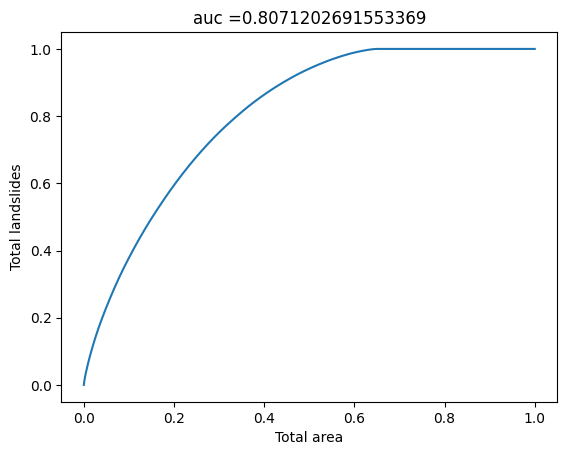

In [32]:
plt.xlabel("Total area")
plt.ylabel("Total landslides")
plt.title(f"{auc =}")
plt.plot(x, y)

This is the best possible success rate based on the ranking by landslide count within SUs.

## **Experiment 2: Best AUC with simple ranking based on SU area**
The benchmark dataset provides binary labels for slope units with columns 'presence1' and 'presence2'. The simple binary labeling restricts us from applying any algorithm that could rank the slope units on the event frequencies. 
To maximize the AUC, we need to bring small slope units to the left corner of the x-axis. Therefore, the relative ranking can be organized in the way that we sort all slope units in descending order for the presence of landslides and ascending order for the areas of the slope units. 
 

In [33]:
sorted2 = gdf_su.sort_values(["presence2", "area"], ascending=[False, True])[["id", "area", "presence2"]]

In [34]:
norm_area = sorted2.area/sorted2.area.sum()
norm_presence2 = sorted2.presence2/sorted2.presence2.sum()

In [35]:
x=[0]
for elem in area_norm.cumsum():
    x.append(elem)
y=[0]
for elem in norm_presence2.cumsum():
    y.append(elem)

Best possible sucsess rate AUC 

In [36]:
auc = calc_auc(x,y)
auc

0.8498325137789695

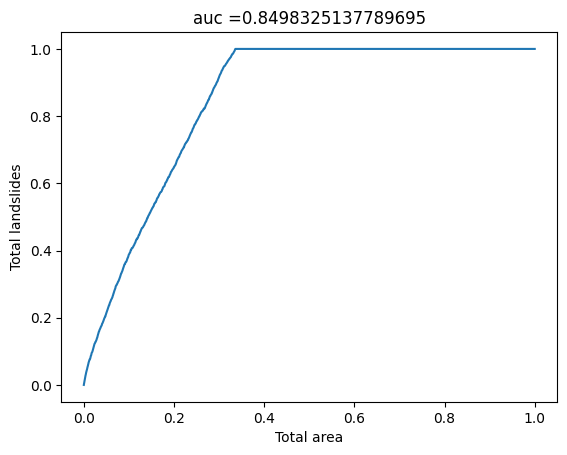

In [37]:
plt.xlabel("Total area")
plt.ylabel("Total landslides")
plt.title(f"{auc =}")
plt.plot(x, y)

# **Classification using Logistic Regression (LR)**

We use the Logistic Regression to perform the binary classifcation task using labels 'presence1' and 'presence2'.


*   we scale the data with MinMax-Scaler
*   we use simple cross validation with random split 70% for training and 30% for test dataset with random seed = 42 



##**1. Use variables as single input with presence1 label:**

In [38]:
skip_list = ["id", "geometry", "presence1", "presence2"]
for col in gdf.columns:
  if col not in skip_list:
    X_tmp = minmax_scale(gdf[[col]].values)
    y = gdf["presence1"]
    X_train, X_val, y_train, y_val = train_test_split(X_tmp, y, test_size=0.3, random_state=42)
    lr_tmp = LogisticRegression(random_state=42).fit(X_train, y_train)
    auc_train = roc_auc_score(y_train, lr_tmp.predict_proba(X_train)[:, 1])
    auc_test = roc_auc_score(y_val, lr_tmp.predict_proba(X_val)[:, 1])
    print(f"X: {col: <{10}} -> {auc_train = : <{19}} - {auc_test = : <{19}}")

X: slope_aver -> auc_train = 0.576854165865662   - auc_test = 0.5747922767421375 
X: slope_stdd -> auc_train = 0.5451105537374318  - auc_test = 0.556312480143044  
X: pcurv_aver -> auc_train = 0.5484847251215453  - auc_test = 0.5271183421217039 
X: pcurv_stdd -> auc_train = 0.5298546732315134  - auc_test = 0.5579962679184656 
X: tcurv_aver -> auc_train = 0.5461085491522919  - auc_test = 0.531686981307575  
X: tcurv_stdd -> auc_train = 0.5453764496301808  - auc_test = 0.558880441216432  
X: nthns_aver -> auc_train = 0.5324916940516066  - auc_test = 0.5325842899563004 
X: nthns_stdd -> auc_train = 0.5051474640377125  - auc_test = 0.519412816982695  
X: easns_aver -> auc_train = 0.5125219852253255  - auc_test = 0.5102287439238741 
X: easns_stdd -> auc_train = 0.49987839805075013 - auc_test = 0.5052553717427409 
X: elev_avera -> auc_train = 0.5147857566649252  - auc_test = 0.519004800149743  
X: elev_stdde -> auc_train = 0.6540499178640274  - auc_test = 0.6449293030793367 
X: twi_averag ->

##**2. Use variables as single input with presence2 label:**

In [39]:
skip_list = ["id", "geometry", "presence1", "presence2"]
for col in gdf.columns:
  if col not in skip_list:
    X_tmp = minmax_scale(gdf[[col]].values)
    y = gdf["presence2"]
    X_train, X_val, y_train, y_val = train_test_split(X_tmp, y, test_size=0.3, random_state=42)
    lr_tmp = LogisticRegression(random_state=42).fit(X_train, y_train)
    auc_train = roc_auc_score(y_train, lr_tmp.predict_proba(X_train)[:, 1])
    auc_test = roc_auc_score(y_val, lr_tmp.predict_proba(X_val)[:, 1])
    print(f"X: {col: <{10}} -> {auc_train = : <{19}} - {auc_test = : <{19}}")

X: slope_aver -> auc_train = 0.5742094968567785  - auc_test = 0.5639258422612156 
X: slope_stdd -> auc_train = 0.5471832008473032  - auc_test = 0.5489232194250554 
X: pcurv_aver -> auc_train = 0.5520006185370353  - auc_test = 0.5630061955643351 
X: pcurv_stdd -> auc_train = 0.4857904639953079  - auc_test = 0.47599797734436655
X: tcurv_aver -> auc_train = 0.547489355326394   - auc_test = 0.5608483811666186 
X: tcurv_stdd -> auc_train = 0.5266015411465925  - auc_test = 0.5258441515479458 
X: nthns_aver -> auc_train = 0.5295760708022048  - auc_test = 0.5227959906050481 
X: nthns_stdd -> auc_train = 0.5149046783892128  - auc_test = 0.5163178215809795 
X: easns_aver -> auc_train = 0.5004977123382834  - auc_test = 0.5000023629154596 
X: easns_stdd -> auc_train = 0.5087463556851312  - auc_test = 0.5122158003430953 
X: elev_avera -> auc_train = 0.5316806270499271  - auc_test = 0.5287543182280025 
X: elev_stdde -> auc_train = 0.6781235408504921  - auc_test = 0.6672447933157848 
X: twi_averag ->

##**3. Stepwise combination of parameters with presence1 label:**

In [40]:
dataY_p1 = gdf_su_new.presence1
dataX = gdf_su_new.drop(["id", "Colamento rapido", "presence1", "presence2",
                         "Aree con crolli/ribaltamenti diffusi",
                         "Aree con frane superficiali diffuse",
                         "Aree con sprofondamenti diffusi", 
                         "Colamento lento",
                         "Colamento rapido", 
                         "Complesso", 
                         "Crollo/Ribaltamento",
                         "Scivolamento rotazionale/traslativo", 
                         "Sprofondamento", "geometry",
                         "n.d."], axis=1)

In [41]:
X_tmp = pd.DataFrame()
for column_name in dataX.columns:
   X_tmp[column_name] = dataX[column_name]
   min_max_scaler = preprocessing.MinMaxScaler()
   x_scaled = min_max_scaler.fit_transform(X_tmp.values)
   dataX_tmp = pd.DataFrame(x_scaled, columns=X_tmp.columns)
   X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p1, test_size = 0.3, random_state = 42, shuffle = True)
   lr_tmp_p1 = LogisticRegression(random_state=42, solver="lbfgs", max_iter=200).fit(X_train, y_train)
   auc_train = roc_auc_score(y_train, lr_tmp_p1.predict_proba(X_train)[:, 1])
   auc_test = roc_auc_score(y_test, lr_tmp_p1.predict_proba(X_test)[:, 1])
   print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")
     

X: Index(['slope_aver'], dtype='object') -> 
auc_train = 0.576854165865662   - auc_test = 0.5747922767421375 
X: Index(['slope_aver', 'slope_stdd'], dtype='object') -> 
auc_train = 0.5889554068388092  - auc_test = 0.5826381859423834 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver'], dtype='object') -> 
auc_train = 0.6131850287117807  - auc_test = 0.5889891280343686 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd'], dtype='object') -> 
auc_train = 0.6181875203078271  - auc_test = 0.5856568537386903 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver'], dtype='object') -> 
auc_train = 0.6186971478198724  - auc_test = 0.5910415265904652 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd'],
      dtype='object') -> 
auc_train = 0.620278953213028   - auc_test = 0.5895851445750591 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver'],
 

##**4. Stepwise combination of parameters with presence2 label**

In [42]:
dataY_p2 = gdf_su_new.presence2
X_tmp = pd.DataFrame()
for column_name in dataX.columns:
   X_tmp[column_name] = dataX[column_name]
   min_max_scaler = preprocessing.MinMaxScaler()
   x_scaled = min_max_scaler.fit_transform(X_tmp.values)
   dataX_tmp = pd.DataFrame(x_scaled, columns=X_tmp.columns)
   X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p2, test_size = 0.3, random_state = 42, shuffle = True)
   lr_tmp_p2 = LogisticRegression(random_state=42, solver="lbfgs", max_iter=200).fit(X_train, y_train)
   auc_train = roc_auc_score(y_train, lr_tmp_p2.predict_proba(X_train)[:, 1])
   auc_test = roc_auc_score(y_test, lr_tmp_p2.predict_proba(X_test)[:, 1])
   print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver'], dtype='object') -> 
auc_train = 0.5742094968567785  - auc_test = 0.5639258422612156 
X: Index(['slope_aver', 'slope_stdd'], dtype='object') -> 
auc_train = 0.5843141071997995  - auc_test = 0.5715391558720813 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver'], dtype='object') -> 
auc_train = 0.6128851442920918  - auc_test = 0.6071482918484141 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd'], dtype='object') -> 
auc_train = 0.6240632971938775  - auc_test = 0.607574561797328  
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver'], dtype='object') -> 
auc_train = 0.6222959468385568  - auc_test = 0.6116642958748223 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd'],
      dtype='object') -> 
auc_train = 0.630028015670554   - auc_test = 0.6239486207662462 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver'],
 

☝ **Comment**: The computed AUC value is a metric that measures the overall performance of a model in predicting the occurrence of landslides. However, in this particular case it does not take into account the spatial extent of the susceptible units (SUs) since they are involved in the analysis as point data. 
It is worth highlighting that the two most influential variables in the model are the SU area and MaxDistance, both of which describe the size of the SU. The probability of a landslide occurring in an SU increases as its size increases. Therefore, the model will tend to estimate SUs with larger areas as more susceptible.
On the other hand, in frequency-based approaches, small SUs with a significant number of landslides will be considered more susceptible, regardless of their size. 

##**5. Models without SU area and MaxDistance**

In [43]:
dataX_noArea = gdf_su_new.drop(["id", "Colamento rapido", "presence1", "presence2",
                         "Aree con crolli/ribaltamenti diffusi",
                         "Aree con frane superficiali diffuse",
                         "Aree con sprofondamenti diffusi", 
                         "Colamento lento",
                         "Colamento rapido", 
                         "Complesso", 
                         "Crollo/Ribaltamento",
                         "Scivolamento rotazionale/traslativo", 
                         "Sprofondamento", "geometry", "area", "Max_Distan", "D_sqrt_A",
                         "n.d."], axis=1)

###**For presence1 label:**

In [44]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX_noArea.values)
dataX_tmp = pd.DataFrame(x_scaled, columns=dataX_noArea.columns)
X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p1, test_size = 0.3, random_state = 42, shuffle = True)
lr_noArea_p1 = LogisticRegression(random_state=42, solver="lbfgs", max_iter=200).fit(X_train, y_train)
auc_train = roc_auc_score(y_train, lr_noArea_p1.predict_proba(X_train)[:, 1])
auc_test = roc_auc_score(y_test, lr_noArea_p1.predict_proba(X_test)[:, 1])
prob_noArea_p1 = lr_noArea_p1.predict_proba(dataX_tmp)[:, 1]
print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object') -> 
auc_train = 0.7373646678864556  - auc_test = 0.7297598611593424 


###**For presence2 label:**

In [45]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX_noArea.values)
dataX_tmp = pd.DataFrame(x_scaled, columns=dataX_noArea.columns)
X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p2, test_size = 0.3, random_state = 42, shuffle = True)
lr_noArea_p2 = LogisticRegression(random_state=42, solver="lbfgs", max_iter=200).fit(X_train, y_train)
auc_train = roc_auc_score(y_train, lr_noArea_p2.predict_proba(X_train)[:, 1])
auc_test = roc_auc_score(y_test, lr_noArea_p2.predict_proba(X_test)[:, 1])
prob_noArea_p2 = lr_noArea_p2.predict_proba(dataX_tmp)[:, 1]
print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object') -> 
auc_train = 0.7630967565597667  - auc_test = 0.7615629268016049 


##**6. Visualization of the results:**

**Result of LR classification compared to Frequency Ratio ranking from Experiment 1**

In [46]:
dataX = gdf_su_new.drop(["id", "Colamento rapido", "presence1", "presence2",
                         "Aree con crolli/ribaltamenti diffusi",
                         "Aree con frane superficiali diffuse",
                         "Aree con sprofondamenti diffusi", 
                         "Colamento lento",
                         "Colamento rapido", 
                         "Complesso", 
                         "Crollo/Ribaltamento",
                         "Scivolamento rotazionale/traslativo", 
                         "Sprofondamento", "geometry",
                         "n.d."], axis=1)

Prepare the data and get probaility P('presence1' = 1) and probability P('presence2'=1) from the LR model

In [47]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX.values)
dataX_scaled = pd.DataFrame(x_scaled, columns=dataX.columns)
prob_p1 = lr_tmp_p1.predict_proba(dataX_scaled)[:, 1]
prob_p2 = lr_tmp_p2.predict_proba(dataX_scaled)[:, 1]

Get the data from Experiment 1 dataframe. Here we generate the log from Frequency Ratio value to equalize the color space of the used cmap.

In [48]:
gdf_res = gdf_su_new[['id', 'geometry', 'Scivolamento rotazionale/traslativo', 'presence1', 'presence2']]
gdf_res['freq_ratio'] = 1/(1+np.exp(-np.log(gdf_type['freq_ratio'])))
gdf_res['freq_ratio'] = gdf_res['freq_ratio'].fillna(0)

/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: title={'center': 'SU ranking based on frequencies'}>

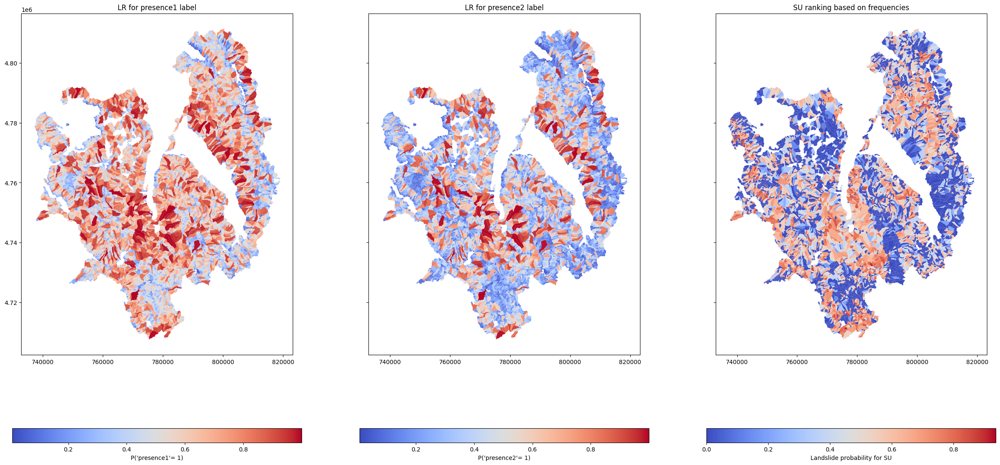

In [50]:
gdf_res["LR_prob_p1"] = prob_p1
gdf_res["LR_prob_p2"] = prob_p2
gdf_res["LR_prob_noArea_p1"] = prob_noArea_p1
gdf_res["LR_prob_noArea_p2"] = prob_noArea_p2

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(30,15))
ax1.set_title("LR for presence1 label")
ax2.set_title("LR for presence2 label")
ax3.set_title("SU ranking based on frequencies")
gdf_res.plot(ax=ax1, column='LR_prob_p1', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence1'= 1)",
                        'orientation': 'horizontal'})
gdf_res.plot(ax=ax2, column='LR_prob_p2', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence2'= 1)",
                        'orientation': 'horizontal'})
gdf_res.plot(ax=ax3, column="freq_ratio", legend=True, cmap="coolwarm",
           legend_kwds={'label': "Landslide probability for SU",
                        'orientation': 'horizontal'})

Model whithout consideration of SU area and Max_Distan variables

<Axes: >

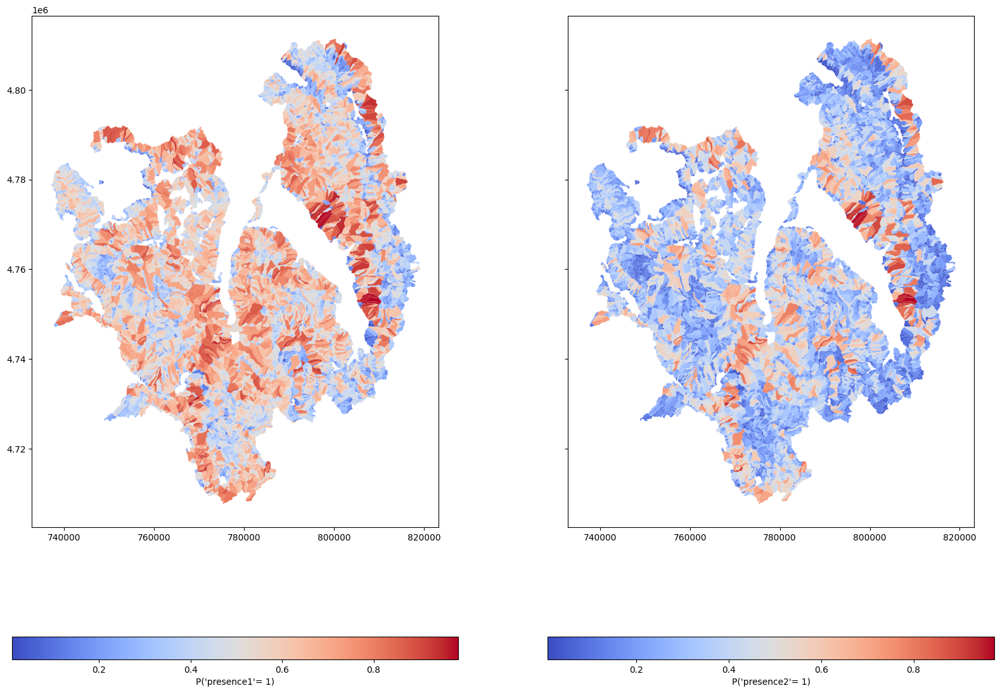

In [51]:
fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, sharey=True, figsize=(20,15))
gdf_res.plot(ax=ax1, column='LR_prob_noArea_p1', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence1'= 1)",
                        'orientation': 'horizontal'})
gdf_res.plot(ax=ax2, column='LR_prob_noArea_p2', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence2'= 1)",
                        'orientation': 'horizontal'})

**Evaluation of the models with success rate considering the SU areas**

Let see how the predictions on binary labels reflect the real landslide count. To simplify the procedure we introduce a function that plot the success rate based on the probability field of the DataFrame. 

In [52]:
def get_success_rate(df, sort_col, event_col):
    sorted_df = df.sort_values(by=sort_col, ascending=False)
    count_norm = sorted_df[event_col]/sorted_df[event_col].sum()
    area_norm = sorted_df.area/sorted_df.area.sum()
    x=[0]
    for elem in area_norm.cumsum():
        x.append(elem)
    y=[0]
    for elem in count_norm.fillna(0).cumsum():
        y.append(elem)
    auc = calc_auc(x,y)
    plt.xlabel("Total area")
    plt.ylabel("Total landslides")
    plt.title(f"{auc =}")
    plt.plot(x, y)

In the next code line you can set following options:


*   Model trained on binary labels evaluated on landslide counts: e.g. get_succes_rate(gdf_res, 'LR_prob_p1', 'Scivolamento rotazionale/traslativo')
*   Model trained on binary labels evaluated by binary labels: e.g. get_success_rate(gdf_res, "LR_prob_p2", "presence1")
* Model trained on landslide count evaluated by binary labels: e.g get_success_rate(gdf_res, "freq_ratio", "presence2")



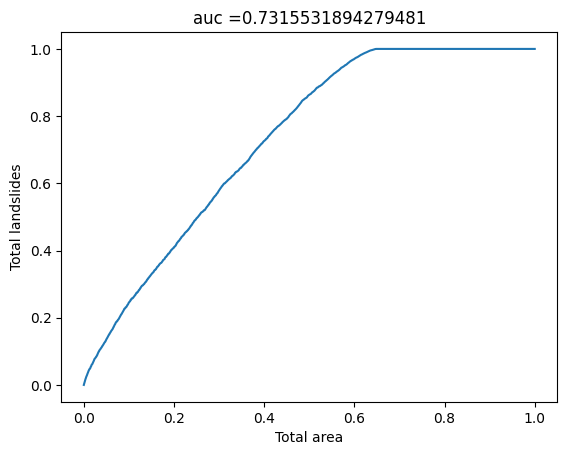

In [54]:
get_success_rate(gdf_res, "freq_ratio", "presence1")

Our observations show that the frequency ranking method produces more accurate results when compared to binary labeling. This is because frequency ranking takes into account the size of the stable unit (SU) area, whereas binary labeling treats all SUs equally. Moreover the observed correlation between SU size and positive label suggest that larger areas has larger probability to have label of 1 ant therefore more 'susceptible'. This of course is misguiding as it can be clearly seen from the succes rates of these models.

# **Classification using Artificial Neural Network (ANN)**

##**1. Use variables as single input with presence1 label:**

In [55]:
skip_list = ["id", "geometry", "presence1", "presence2"]
for col in gdf.columns:
  if col not in skip_list:
    X_tmp = minmax_scale(gdf[[col]].values)
    y = gdf["presence1"]
    X_train, X_val, y_train, y_val = train_test_split(X_tmp, y, test_size=0.3, random_state=42)
    ann_tmp = MLPClassifier(random_state=42, max_iter=300).fit(X_train, y_train)
    auc_train = roc_auc_score(y_train, ann_tmp.predict_proba(X_train)[:, 1])
    auc_test = roc_auc_score(y_val, ann_tmp.predict_proba(X_val)[:, 1])
    print(f"X: {col: <{10}} -> {auc_train = : <{19}} - {auc_test = : <{19}}")

X: slope_aver -> auc_train = 0.6414159804411597  - auc_test = 0.6503074082557322 
X: slope_stdd -> auc_train = 0.6147790470719412  - auc_test = 0.6424828440004697 
X: pcurv_aver -> auc_train = 0.5728004408730312  - auc_test = 0.5478943622253583 
X: pcurv_stdd -> auc_train = 0.6193325990475393  - auc_test = 0.6239357287287361 
X: tcurv_aver -> auc_train = 0.5634346783428663  - auc_test = 0.5569815620723315 
X: tcurv_stdd -> auc_train = 0.6341442140314929  - auc_test = 0.6300362781968775 
X: nthns_aver -> auc_train = 0.5324916940516066  - auc_test = 0.5325842899563004 
X: nthns_stdd -> auc_train = 0.5191819724544822  - auc_test = 0.5306041358293784 
X: easns_aver -> auc_train = 0.5217958489482148  - auc_test = 0.5181707053765454 
X: easns_stdd -> auc_train = 0.5265643340653574  - auc_test = 0.5409441197549929 
X: elev_avera -> auc_train = 0.5408382769463662  - auc_test = 0.5543561338393728 
X: elev_stdde -> auc_train = 0.6559673536837549  - auc_test = 0.6442544744340921 
X: twi_averag ->

##**2. Use variables as single input with presence2 label:**

In [56]:
skip_list = ["id", "geometry", "presence1", "presence2"]
for col in gdf.columns:
  if col not in skip_list:
    X_tmp = minmax_scale(gdf[[col]].values)
    y = gdf["presence2"]
    X_train, X_val, y_train, y_val = train_test_split(X_tmp, y, test_size=0.3, random_state=42)
    ann_tmp = MLPClassifier(random_state=42, max_iter=300).fit(X_train, y_train)
    auc_train = roc_auc_score(y_train, ann_tmp.predict_proba(X_train)[:, 1])
    auc_test = roc_auc_score(y_val, ann_tmp.predict_proba(X_val)[:, 1])
    print(f"X: {col: <{10}} -> {auc_train = : <{19}} - {auc_test = : <{19}}")

X: slope_aver -> auc_train = 0.630493697897686   - auc_test = 0.6443878394918786 
X: slope_stdd -> auc_train = 0.6031070631377551  - auc_test = 0.6242614707730987 
X: pcurv_aver -> auc_train = 0.5997288651091017  - auc_test = 0.5770012712485173 
X: pcurv_stdd -> auc_train = 0.6102317165007743  - auc_test = 0.6226906045755496 
X: tcurv_aver -> auc_train = 0.5880489071326075  - auc_test = 0.5837828386175999 
X: tcurv_stdd -> auc_train = 0.6265689416112428  - auc_test = 0.614742702135603  
X: nthns_aver -> auc_train = 0.5295760708022048  - auc_test = 0.5227959906050481 
X: nthns_stdd -> auc_train = 0.5416850543230686  - auc_test = 0.5442843437947477 
X: easns_aver -> auc_train = 0.5267004786010386  - auc_test = 0.5345302287774748 
X: easns_stdd -> auc_train = 0.5460644602428025  - auc_test = 0.536101094975024  
X: elev_avera -> auc_train = 0.5316806270499271  - auc_test = 0.5287543182280025 
X: elev_stdde -> auc_train = 0.6803928742255831  - auc_test = 0.6623138613346692 
X: twi_averag ->

##**3. Stepwise combination of parameters with presence1 label:**

In [57]:
X_tmp = pd.DataFrame()
for column_name in dataX.columns:
   X_tmp[column_name] = dataX[column_name]
   min_max_scaler = preprocessing.MinMaxScaler()
   x_scaled = min_max_scaler.fit_transform(X_tmp.values)
   dataX_tmp=pd.DataFrame(x_scaled, columns=X_tmp.columns)
   X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p1, test_size = 0.3, random_state = 42, shuffle = True)
   ann_tmp_p1 = MLPClassifier(random_state=42, max_iter=300).fit(X_train, y_train)
   auc_train = roc_auc_score(y_train, ann_tmp_p1.predict_proba(X_train)[:, 1])
   auc_test = roc_auc_score(y_test, ann_tmp_p1.predict_proba(X_test)[:, 1])
   print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver'], dtype='object') -> 
auc_train = 0.6414159804411597  - auc_test = 0.6503074082557322 
X: Index(['slope_aver', 'slope_stdd'], dtype='object') -> 
auc_train = 0.6559270961258508  - auc_test = 0.6647989839806188 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver'], dtype='object') -> 
auc_train = 0.6989698136165534  - auc_test = 0.6892988760244547 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver'], dtype='object') -> 
auc_train = 0.7081741689716756  - auc_test = 0.6931114115822596 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd'],
      dtype='object') -> 
auc_train = 0.7156213648518348  - auc_test = 0.7011658444758051 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver'],
      dtype='object') -> 
auc_train = 0.7207030145673556  - auc_test = 0.7071703416915212 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_std

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave'],
      dtype='object') -> 
auc_train = 0.7947849123116507  - auc_test = 0.7747796339670319 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std'],
      dtype='object') -> 
auc_train = 0.7985382133937047  - auc_test = 0.7754725237195701 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_a

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object') -> 
auc_train = 0.8219503203642179  - auc_test = 0.7880717879757356 


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std', 'Max_Distan'],
      dtype='object') -> 
auc_train = 0.8225745386777881  - auc_test = 0.8040254924319854 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std', 'Max_Distan',
       'D_sqrt_A'],
      dtype='object') -> 
auc_train = 0.8308662386097121  - auc_test = 0.808613834643995  
X: Index(['slope_aver

##**4. Stepwise combination of parameters with presence2 label:**

In [58]:
X_tmp = pd.DataFrame()
for column_name in dataX.columns:
   X_tmp[column_name] = dataX[column_name]
   min_max_scaler = preprocessing.MinMaxScaler()
   x_scaled = min_max_scaler.fit_transform(X_tmp.values)
   dataX_tmp=pd.DataFrame(x_scaled, columns=X_tmp.columns)
   X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p2, test_size = 0.3, random_state = 42, shuffle = True)
   ann_tmp_p2 = MLPClassifier(random_state=42, max_iter=300).fit(X_train, y_train)
   auc_train = roc_auc_score(y_train, ann_tmp_p2.predict_proba(X_train)[:, 1])
   auc_test = roc_auc_score(y_test, ann_tmp_p2.predict_proba(X_test)[:, 1])
   print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver'], dtype='object') -> 
auc_train = 0.630493697897686   - auc_test = 0.6443878394918786 
X: Index(['slope_aver', 'slope_stdd'], dtype='object') -> 
auc_train = 0.6458514244146318  - auc_test = 0.6598517034257548 


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver'], dtype='object') -> 
auc_train = 0.7024913376343842  - auc_test = 0.7027301125220342 


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd'], dtype='object') -> 
auc_train = 0.7220693871856778  - auc_test = 0.7112337726780812 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver'], dtype='object') -> 
auc_train = 0.7214481809743987  - auc_test = 0.7071412031020353 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd'],
      dtype='object') -> 
auc_train = 0.7406226511251822  - auc_test = 0.7326020897624325 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver'],
      dtype='object') -> 
auc_train = 0.7458351958249818  - auc_test = 0.737636044857587  
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd'],
      dtype='object') -> 
auc_train = 0.747924626742438   - auc_test = 0.7401917742187021 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_st

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std'],
      dtype='object') -> 
auc_train = 0.8213728746241801  - auc_test = 0.8020500654527583 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave'],
      dtype='object') -> 
auc_train = 0.8196073037194789  - auc_test = 0.8073420509161023 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std'],
      dt

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object') -> 
auc_train = 0.8436419873473944  - auc_test = 0.8169364328483055 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std', 'Max_Distan'],
      dtype='object') -> 
auc_train = 0.8537432167342384  - auc_test = 0.8290147115116516 
X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'p

##**5. Models without SU area and MaxDistance**

###**For presence1 label:**

In [59]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX_noArea.values)
dataX_tmp=pd.DataFrame(x_scaled, columns=dataX_noArea.columns)
X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p1, test_size = 0.3, random_state = 42, shuffle = True)
ann_noArea_p1 = MLPClassifier(random_state=42, max_iter=300).fit(X_train, y_train)
auc_train = roc_auc_score(y_train, ann_noArea_p1.predict_proba(X_train)[:, 1])
auc_test = roc_auc_score(y_test, ann_noArea_p1.predict_proba(X_test)[:, 1])
ann_prob_noArea_p1 = ann_noArea_p1.predict_proba(dataX_tmp)[:, 1]
print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object') -> 
auc_train = 0.8219503203642179  - auc_test = 0.7880717879757356 


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


###**For presence2 label:**

In [60]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX_noArea.values)
dataX_tmp=pd.DataFrame(x_scaled, columns=dataX_noArea.columns)
X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, dataY_p2, test_size = 0.3, random_state = 42, shuffle = True)
ann_noArea_p2 = MLPClassifier(random_state=42, max_iter=300).fit(X_train, y_train)
auc_train = roc_auc_score(y_train, ann_noArea_p2.predict_proba(X_train)[:, 1])
auc_test = roc_auc_score(y_test, ann_noArea_p2.predict_proba(X_test)[:, 1])
ann_prob_noArea_p2 = ann_noArea_p2.predict_proba(dataX_tmp)[:, 1]
print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object') -> 
auc_train = 0.8436419873473944  - auc_test = 0.8169364328483055 


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


##**6. Visualization of the results:**

In [61]:
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX.values)
dataX_scaled = pd.DataFrame(x_scaled, columns=dataX.columns)
ann_prob_p1 = ann_tmp_p1.predict_proba(dataX_scaled)[:, 1]
ann_prob_p2 = ann_tmp_p2.predict_proba(dataX_scaled)[:, 1]

/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

<Axes: >

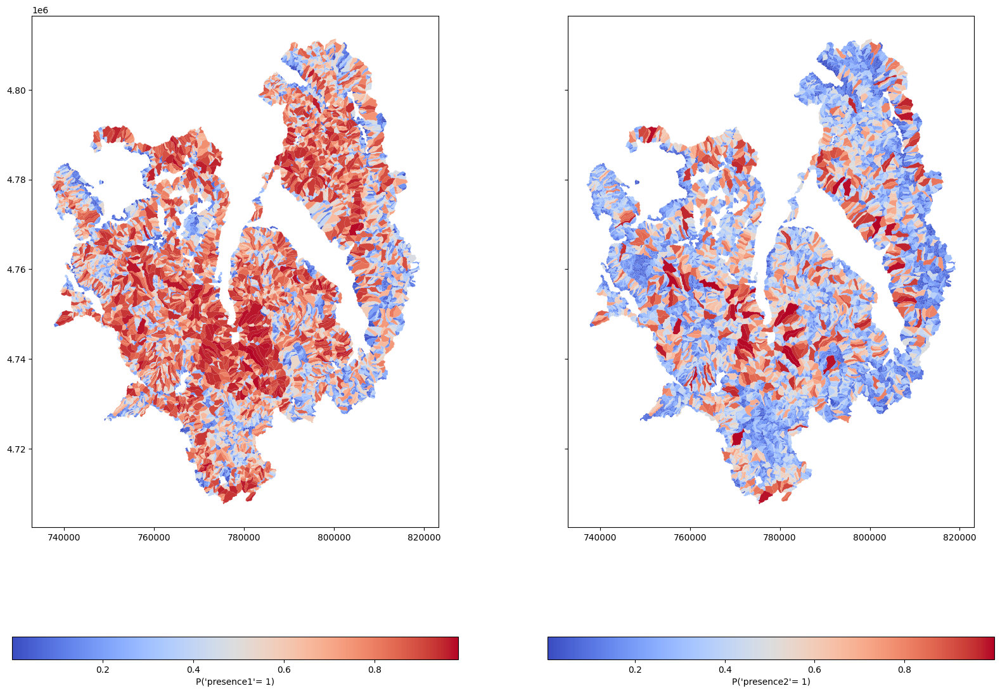

In [62]:
gdf_res["ANN_prob_p1"] = ann_prob_p1
gdf_res["ANN_prob_p2"] = prob_p2
gdf_res["ANN_prob_noArea_p1"] = ann_prob_noArea_p1
gdf_res["ANN_prob_noArea_p2"] = ann_prob_noArea_p2

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, sharey=True, figsize=(20,15))
ax1.set_title('ANN for presence1 label')
ax2.set_title('ANN for presence2 label')
gdf_res.plot(ax=ax1, column='ANN_prob_p1', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence1'= 1)",
                        'orientation': 'horizontal'})
gdf_res.plot(ax=ax2, column='ANN_prob_p2', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence2'= 1)",
                        'orientation': 'horizontal'})


**Models without SU area and Max_Distan compared with FR model**

<Axes: title={'center': 'SU ranked by landslide count (frequency ratio)'}>

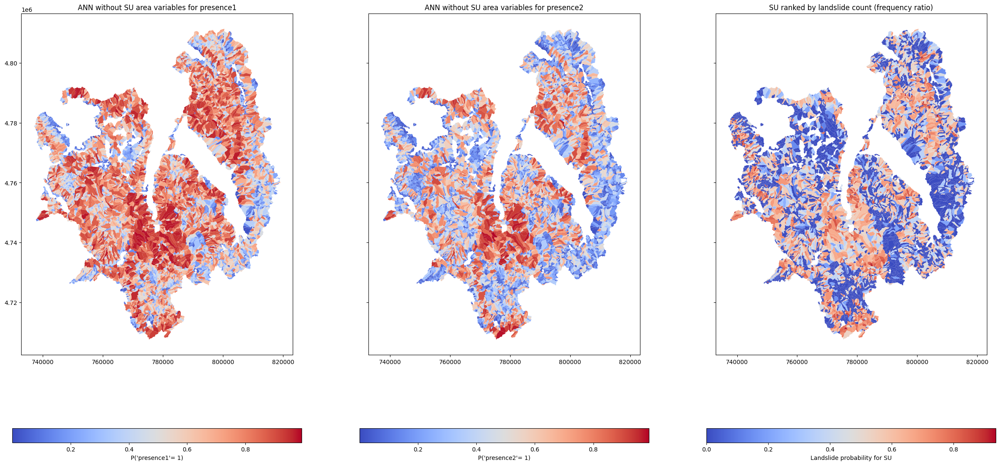

In [63]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(30,15))
ax1.set_title('ANN without SU area variables for presence1')
ax2.set_title('ANN without SU area variables for presence2')
ax3.set_title('SU ranked by landslide count (frequency ratio)')
gdf_res.plot(ax=ax1, column='ANN_prob_noArea_p1', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence1'= 1)",
                        'orientation': 'horizontal'})
gdf_res.plot(ax=ax2, column='ANN_prob_noArea_p2', legend=True, cmap="coolwarm",
           legend_kwds={'label': "P('presence2'= 1)",
                        'orientation': 'horizontal'})
gdf_res.plot(ax=ax3, column="freq_ratio", legend=True, cmap="coolwarm",
           legend_kwds={'label': "Landslide probability for SU",
                        'orientation': 'horizontal'})

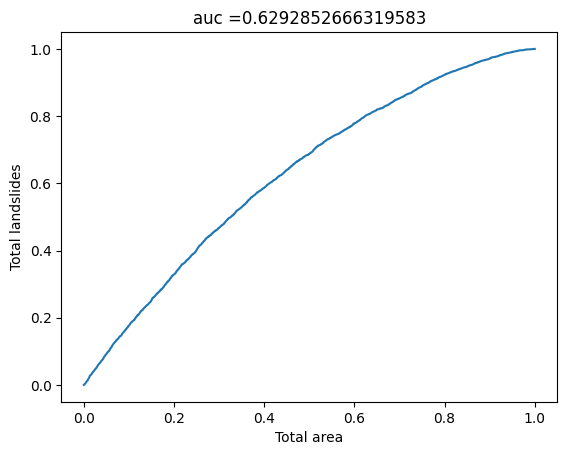

In [67]:
get_success_rate(gdf_res, 'ANN_prob_noArea_p2', 'Scivolamento rotazionale/traslativo')

## **Export results to shapefile**

In [68]:
gdf_res.to_file("results_benchmark_su.shp")

<ipython-input-68-f74575d5f5fd>:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_res.to_file("results_benchmark_su.shp")


#**Regression Analysis**

## All variables

In [ ]:
dataX = gdf_su_new.drop(["id", "Colamento rapido", "presence1", "presence2",
                         "Aree con crolli/ribaltamenti diffusi",
                         "Aree con frane superficiali diffuse",
                         "Aree con sprofondamenti diffusi", 
                         "Colamento lento",
                         "Colamento rapido", 
                         "Complesso", 
                         "Crollo/Ribaltamento",
                         "Scivolamento rotazionale/traslativo", 
                         "Sprofondamento", "geometry",
                         "n.d."], axis=1)
dataX.columns

Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std', 'Max_Distan',
       'D_sqrt_A', 'area'],
      dtype='object')

In [ ]:
dataY = gdf_su_new["Scivolamento rotazionale/traslativo"].fillna(0)

In [ ]:
column_transformer = make_column_transformer((StandardScaler(), dataX.columns))
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size = 0.3, random_state = 42, shuffle = True)
column_transformer.fit(X_train)
X_train_normal = column_transformer.transform(X_train)
X_test_normal = column_transformer.transform(X_test)
N, D = X_train.shape
model = tf.keras.models.Sequential([tf.keras.layers.Input(shape=(D,)),
                             tf.keras.layers.Dense(100, activation="relu"),
                             tf.keras.layers.Dense(100, activation="relu"),
                             tf.keras.layers.Dense(100, activation="relu"),
                             tf.keras.layers.Dense(100, activation="relu"),
                             tf.keras.layers.Dense(1)])
model.compile(loss = tf.keras.losses.mae,
             optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
             metrics=["mae"])
r = model.fit(X_train_normal, y_train, validation_data=(X_test_normal, y_test), epochs=20, verbose=0)


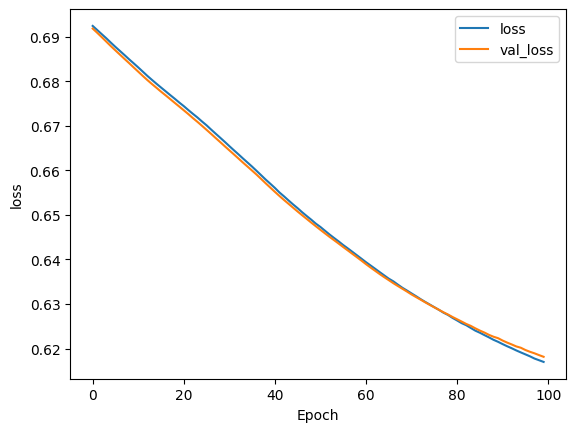

In [ ]:
#plot what's returned by model.fit()
plt.plot(r.history['loss'], label = "loss")
plt.plot(r.history["val_loss"], label = "val_loss")
plt.xlabel("Epoch")
plt.ylabel("loss")
plt.legend()

In [ ]:
y_pred = model.predict(X_test_normal)
y_fit = model.predict(X_train_normal)

161/161 [==============================] - 0s 2ms/step


Text(0.5, 0, 'y_fit')

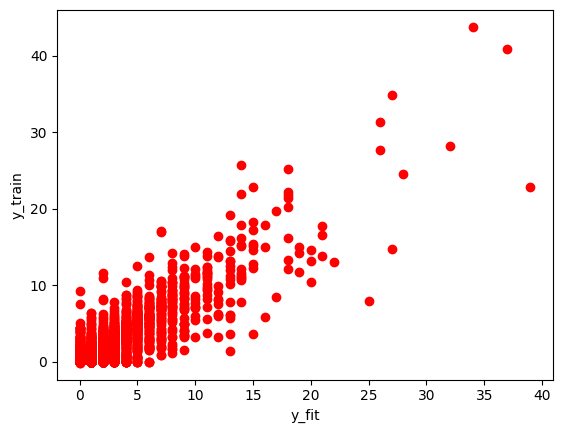

In [ ]:
plt.scatter(y_train, y_fit, c="r", label = "prediction")
plt.ylabel("y_train")
plt.xlabel("y_fit")

Text(0.5, 0, 'y_pred')

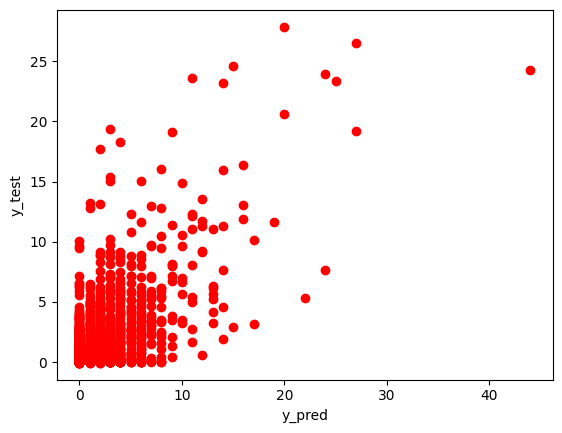

In [ ]:
plt.scatter(y_test, y_pred, c="r", label = "prediction")
plt.ylabel("y_test")
plt.xlabel("y_pred")

## All possible without information about the slope area and derived information

In [ ]:
dataX = gdf_su_new.drop(["id", "Colamento rapido", "presence1", "presence2",
  "Aree con crolli/ribaltamenti diffusi",
  "Aree con frane superficiali diffuse",
  "Aree con sprofondamenti diffusi", 
  "Colamento lento",
  "Colamento rapido", 
  "Complesso", 
  "Crollo/Ribaltamento",
  "Scivolamento rotazionale/traslativo", 
  "Sprofondamento", "geometry",
  "n.d.", "Max_Distan",
  "D_sqrt_A", "area"], axis=1)
dataY = gdf_su_new["Scivolamento rotazionale/traslativo"].fillna(0)
dataX.columns

Index(['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std'],
      dtype='object')

In [ ]:
column_transformer = make_column_transformer((StandardScaler(), ['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std']))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size = 0.3, random_state = 42, shuffle = True)
X_train.head()

,slope_aver,slope_stdd,pcurv_aver,pcurv_stdd,tcurv_aver,tcurv_stdd,nthns_aver,nthns_stdd,easns_aver,easns_stdd,...,BDRICM_ave,BDRICM_std,BLDFIE_ave,BLDFIE_std,CLYPPT_ave,CLYPPT_std,SLTPPT_ave,SLTPPT_std,SNDPPT_ave,SNDPPT_std
4951,3.532425,1.134937,-0.000028,0.000448,0.000033,0.000329,0.266994,0.241690,-0.929732,0.076796,...,200.000000,0.000000,1546.616455,15.599096,29.810845,1.650120,39.127421,2.523881,31.243574,1.247649
2840,9.800628,6.100115,0.000018,0.001161,0.000006,0.001336,0.423837,0.386719,0.739381,0.352316,...,199.507863,1.570049,1487.889076,39.021936,38.215733,1.753603,33.756356,2.168954,28.069550,1.282283
4560,8.494932,3.722766,-0.000035,0.001673,-0.000166,0.001338,0.279870,0.361221,-0.863091,0.215098,...,200.000000,0.000000,1568.789068,14.682724,37.392464,3.040462,35.739855,1.265863,26.972108,2.316080
2389,4.433271,1.503416,0.000012,0.000681,-0.000007,0.000592,-0.887083,0.127138,-0.170773,0.409581,...,200.000000,0.000000,1563.718755,17.965969,37.783352,0.615877,39.281079,0.719881,23.259849,0.897833
5507,7.420491,3.460850,-0.000107,0.001247,0.000123,0.001075,0.544721,0.499918,0.152841,0.655745,...,200.000000,0.000000,1592.753129,11.787470,35.342760,1.166391,38.070186,0.552352,26.514845,0.896485


In [ ]:
column_transformer.fit(X_train)
X_train_normal = column_transformer.transform(X_train)

In [ ]:
N, D = X_train.shape
model = tf.keras.models.Sequential([tf.keras.layers.Input(shape=(D,)),
                             tf.keras.layers.Dense(300, activation="relu"),
                             tf.keras.layers.Dense(1)])
model.compile(loss = tf.keras.losses.mae,
             optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
             metrics=["mae"])

model.fit(X_train_normal, y_train, epochs = 300, verbose=0)

In [ ]:
X_test_norm = column_transformer.transform(X_test)
y_pred = model.predict(X_test_norm)

69/69 [==============================] - 0s 2ms/step


In [ ]:
y_fit = model.predict(X_train_normal)

161/161 [==============================] - 0s 2ms/step


Text(0.5, 0, 'y_fit')

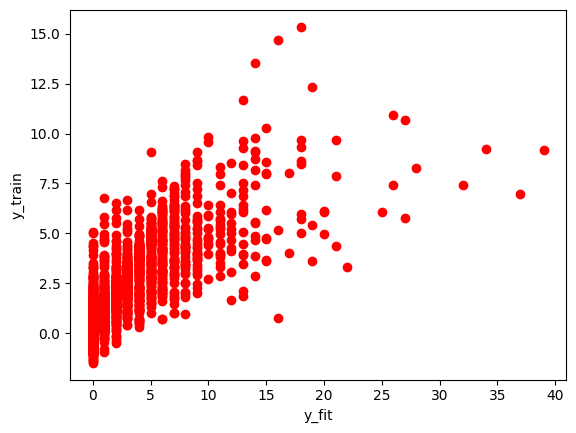

In [ ]:
plt.scatter(y_train, y_fit, c="r", label = "prediction")
plt.ylabel("y_train")
plt.xlabel("y_fit")

Text(0.5, 0, 'y_pred')

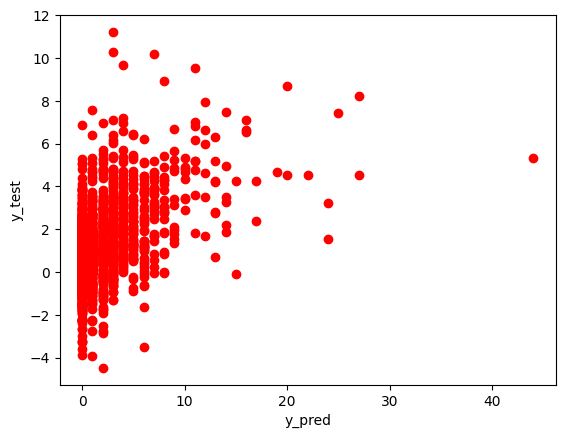

In [ ]:
plt.scatter(y_test, y_pred, c="r", label = "prediction")
plt.ylabel("y_test")
plt.xlabel("y_pred")

In [ ]:
model.evaluate(X_test_norm, y_test)

69/69 [==============================] - 0s 3ms/step - loss: 1.5603 - mae: 1.5603


[1.5603339672088623, 1.5603339672088623]

# Classification with ANN part 2 (Tensorflow)

In [ ]:
dataY = gdf_su_new.presence1
dataX = gdf_su_new.drop(["id", "Colamento rapido", "presence1", "presence2",
                         "Aree con crolli/ribaltamenti diffusi",
                         "Aree con frane superficiali diffuse",
                         "Aree con sprofondamenti diffusi", 
                         "Colamento lento",
                         "Colamento rapido", 
                         "Complesso", 
                         "Crollo/Ribaltamento",
                         "Scivolamento rotazionale/traslativo", 
                         "Sprofondamento", "geometry",
                         "n.d."], axis=1)

In [ ]:
dataX_noArea = dataX[['slope_aver', 'slope_stdd', 'pcurv_aver', 'pcurv_stdd', 'tcurv_aver',
       'tcurv_stdd', 'nthns_aver', 'nthns_stdd', 'easns_aver', 'easns_stdd',
       'elev_avera', 'elev_stdde', 'twi_averag', 'twi_stddev', 'BDRICM_ave',
       'BDRICM_std', 'BLDFIE_ave', 'BLDFIE_std', 'CLYPPT_ave', 'CLYPPT_std',
       'SLTPPT_ave', 'SLTPPT_std', 'SNDPPT_ave', 'SNDPPT_std']]
column_transformer = make_column_transformer((MinMaxScaler(), dataX_noArea.columns))
X_train, X_test, y_train, y_test = train_test_split(dataX_noArea, dataY, test_size = 0.3, random_state = 42, shuffle = True)
column_transformer.fit(X_train)
X_train_normal = column_transformer.transform(X_train)
X_test_normal = column_transformer.transform(X_test)
N, D = X_train.shape
model = tf.keras.models.Sequential([tf.keras.layers.Input(shape=(D,)),
                                    tf.keras.layers.Dense(100, activation="relu"),
                                    tf.keras.layers.Dense(100, activation="relu"),
                                    tf.keras.layers.Dense(1, activation="sigmoid")])
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
             loss = "binary_crossentropy",
             metrics=tf.keras.metrics.AUC())

In [ ]:
r = model.fit(X_train_normal, y_train, validation_data=(X_test_normal, y_test), epochs=100, verbose=False)
print("Train score:", model.evaluate(X_train_normal, y_train))
print("Test_score: ", model.evaluate(X_test_normal, y_test))


161/161 [==============================] - 0s 2ms/step - loss: 0.6166 - auc: 0.7272
Train score: [0.6166023015975952, 0.727225661277771]
69/69 [==============================] - 0s 2ms/step - loss: 0.6181 - auc: 0.7290
Test_score: [0.6181362271308899, 0.72901451587677]


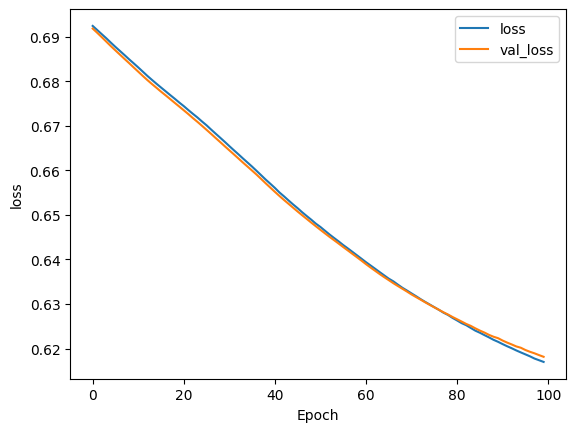

In [ ]:
#plot what's returned by model.fit()
plt.plot(r.history['loss'], label = "loss")
plt.plot(r.history["val_loss"], label = "val_loss")
plt.xlabel("Epoch")
plt.ylabel("loss")
plt.legend()

#**What about other metrics of central tendency for aggregation?**

We calculated the minimum, 0.25 quantile, median, 0.75 quantile and maxium slope angle in each slope unit with EU-DEM v1.1 \[0\].

The updated Shapefile is available on our GitHub \[1\].

**Comment:**
Our slope differs very slightly compared to the provided information in the benchmark dataset, but there is not enough of a difference to make a difference.

\[0\]: https://land.copernicus.eu/imagery-in-situ/eu-dem/eu-dem-v1.1

\[1\]: https://github.com/BGR-EGHA/EGU23_GM3.3_ls_benchmark

In [ ]:
gdf_q = geopandas.read_file("su_benchmark_updated.shp")
gdf_q.columns

ERROR:fiona._env:su_benchmark_updated.shp: No such file or directory


DriverError: ignored

In [ ]:
gdf_q_select = gdf_q[['presence1', 'slope_med',
       'slope_max', 'slope_min', 'slope_25q', 'slope_75q']]

### **Variables Pair-Plots**

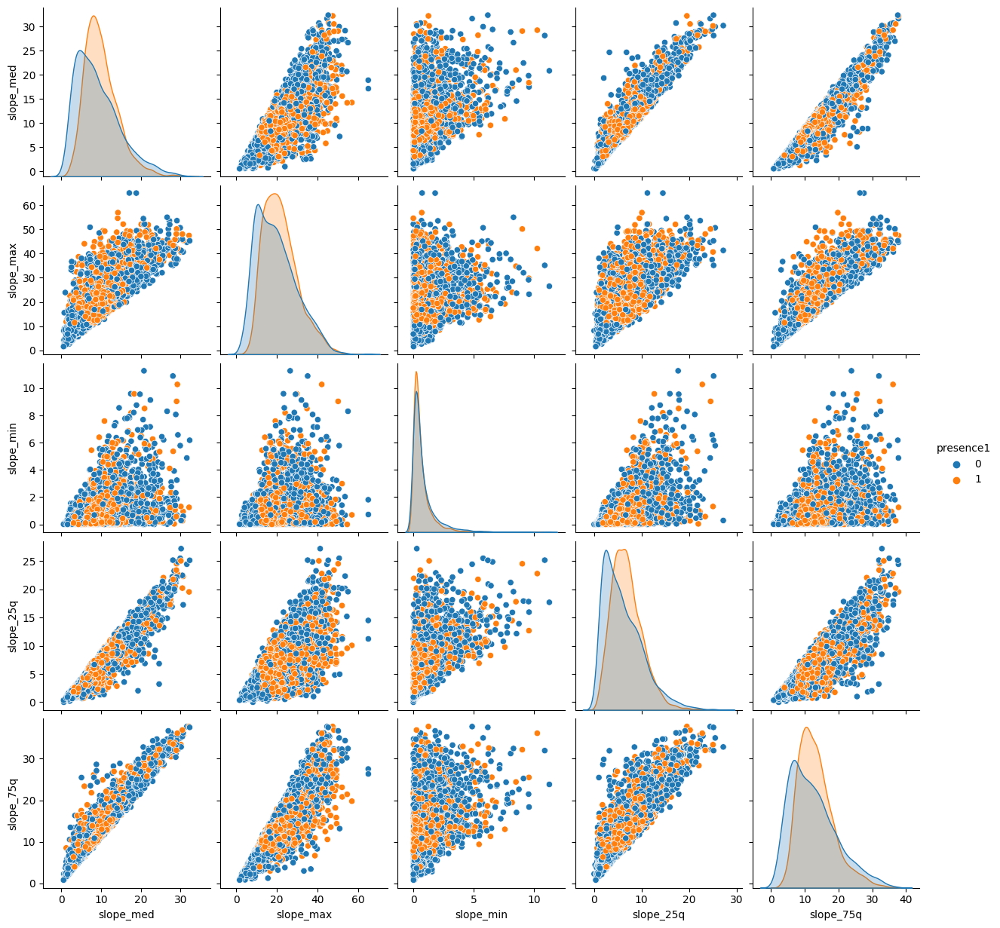

In [ ]:
sns.pairplot(gdf_q_select, hue='presence1', diag_kind='kde')

##**1. Use variables as single input with presence1 label:**

In [ ]:
skip_list = ["id", "geometry", "presence1", "presence2"]
for col in gdf_q_select.columns:
  if col not in skip_list:
    X_tmp = minmax_scale(gdf_q_select[[col]].values)
    y = gdf_q_select["presence1"]
    X_train, X_val, y_train, y_val = train_test_split(X_tmp, y, test_size=0.3, random_state=42)
    lr_tmp_q = LogisticRegression(random_state=42).fit(X_train, y_train)
    auc_train = roc_auc_score(y_train, lr_tmp_q.predict_proba(X_train)[:, 1])
    auc_test = roc_auc_score(y_val, lr_tmp_q.predict_proba(X_val)[:, 1])
    print(f"X: {col: <{10}} -> {auc_train = : <{19}} - {auc_test = : <{19}}")

X: area -> auc_train = 0.7210495009645983, auc_test = 0.7231544216464012
X: slope_med -> auc_train = 0.5793769728276562, auc_test = 0.5790776849272671
X: slope_max -> auc_train = 0.5799346229321826, auc_test = 0.5858883642958179
X: slope_min -> auc_train = 0.520367082586043, auc_test = 0.5326594077434536
X: slope_25q -> auc_train = 0.5915172651397442, auc_test = 0.5896623147607684
X: slope_75q -> auc_train = 0.5646172252591298, auc_test = 0.5630845744187403


##**2. Use all variables with presence1 label:**

In [ ]:
dataX_q = gdf_q_select.drop(['presence1'], axis=1)
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(dataX_q.values)
dataX_tmp = pd.DataFrame(x_scaled, columns=dataX_q.columns)
X_train, X_test, y_train, y_test = train_test_split(dataX_tmp, y, test_size = 0.3, random_state = 42, shuffle = True)
lr_q_p1 = LogisticRegression(random_state=42, solver="lbfgs", max_iter=200).fit(X_train, y_train)
auc_train = roc_auc_score(y_train, lr_q_p1.predict_proba(X_train)[:, 1])
auc_test = roc_auc_score(y_test, lr_q_p1.predict_proba(X_test)[:, 1])
prob_noArea_p1 = lr_q_p1.predict_proba(dataX_tmp)[:, 1]
print(f"X: {dataX_tmp.columns} -> \n{auc_train = : <{19}} - {auc_test = : <{19}}")

X: Index(['slope_med', 'slope_max', 'slope_min', 'slope_25q', 'slope_75q'], dtype='object') -> auc_train = 0.6522645630207945, auc_test =0.6560262115924397
